# Task 3
---
Binary classification

[Kaggle](https://www.kaggle.com/dipayanbiswas/parkinsons-disease-speech-signal-features)

# Dataset description

__Context__

This dataset is collected from UCI Machine Learning Repository through the following link: [click](https://archive.ics.uci.edu/ml/datasets/Parkinson%27s+Disease+Classification#)

__Data Set Information:__

The data used in this study were gathered from 188 patients with PD (107 men and 81 women) with ages ranging from 33 to 87 (65.1±10.9) at the Department of Neurology in Cerrahpaya Faculty of Medicine, Istanbul University. The control group consists of 64 healthy individuals (23 men and 41 women) with ages varying between 41 and 82 (61.1±8.9). During the data collection process, the microphone is set to 44.1 KHz and following the physician's examination, the sustained phonation of the vowel /a/ was collected from each subject with three repetitions.

__Attribute Information:__

Various speech signal processing algorithms including Time Frequency Features, Mel Frequency Cepstral Coefficients (MFCCs), Wavelet Transform based Features, Vocal Fold Features and TWQT features have been applied to the speech recordings of Parkinson's Disease (PD) patients to extract clinically useful information for PD assessment. [Related paper](https://www.sciencedirect.com/science/article/abs/pii/S1568494618305799?via%3Dihub)

Attribute description:

- Baseline Features: Col3 to Col23
- Intensity Parameters: Col24 to Col26
- Formant Frequencies: Col27 to Col30
- Bandwidth Parameters: Col31 to Col34
- Vocal Fold: Col35 to Col56
- MFCC: Col57 to Col140
- Wavelet Features: Col141 to Col322
- TQWT Features: Col323 to Col754
- Class: Col755

[Similar paper](https://arxiv.org/ftp/arxiv/papers/1905/1905.00377.pdf)

# Import required libraries

In [67]:
import numpy as np

import pandas as pd

from matplotlib import pyplot as plt

import seaborn as sns

from sklearn.preprocessing import QuantileTransformer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import StratifiedGroupKFold, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score, recall_score, precision_score, accuracy_score, confusion_matrix
from sklearn.decomposition import PCA
from sklearn.utils import resample

from sklearn_pandas import DataFrameMapper, gen_features

from catboost import CatBoostClassifier

from lightgbm import LGBMClassifier

from xgboost import XGBClassifier

from imblearn.over_sampling import SMOTENC
from imblearn.pipeline import Pipeline

from IPython.display import HTML, display

from typing import Tuple

import plotly.express as px

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline
sns.set_theme()

In [2]:
PALETTE = sns.color_palette("Set2")
RANDOM_STATE = 42

In [3]:
sns.set_context("paper", rc={"font.size":12, 
                             "figure.titlesize":18, 
                             "axes.titlesize":15, 
                             "axes.labelsize":13, 
                             "xtick.labelsize": 13,
                             "ytick.labelsize": 13,
                             "legend.fontsize": 9,
                             "legend.title_fontsize": 11}) 

# EDA

In [4]:
data = pd.read_csv('archive/pd_speech_features.csv')

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 756 entries, 0 to 755
Columns: 755 entries, id to class
dtypes: float64(749), int64(6)
memory usage: 4.4 MB


There are 756 rows with a lot of columns - 755. Each person has 3 records, so there are 252 patients overall

In [6]:
data.head()

,id,gender,PPE,DFA,RPDE,numPulses,numPeriodsPulses,meanPeriodPulses,stdDevPeriodPulses,locPctJitter,...,tqwt_kurtosisValue_dec_28,tqwt_kurtosisValue_dec_29,tqwt_kurtosisValue_dec_30,tqwt_kurtosisValue_dec_31,tqwt_kurtosisValue_dec_32,tqwt_kurtosisValue_dec_33,tqwt_kurtosisValue_dec_34,tqwt_kurtosisValue_dec_35,tqwt_kurtosisValue_dec_36,class
0,0,1,0.85247,0.71826,0.57227,240,239,0.008064,0.000087,0.00218,...,1.5620,2.6445,3.8686,4.2105,5.1221,4.4625,2.6202,3.0004,18.9405,1
1,0,1,0.76686,0.69481,0.53966,234,233,0.008258,0.000073,0.00195,...,1.5589,3.6107,23.5155,14.1962,11.0261,9.5082,6.5245,6.3431,45.1780,1
2,0,1,0.85083,0.67604,0.58982,232,231,0.008340,0.000060,0.00176,...,1.5643,2.3308,9.4959,10.7458,11.0177,4.8066,2.9199,3.1495,4.7666,1
3,1,0,0.41121,0.79672,0.59257,178,177,0.010858,0.000183,0.00419,...,3.7805,3.5664,5.2558,14.0403,4.2235,4.6857,4.8460,6.2650,4.0603,1
4,1,0,0.32790,0.79782,0.53028,236,235,0.008162,0.002669,0.00535,...,6.1727,5.8416,6.0805,5.7621,7.7817,11.6891,8.2103,5.0559,6.1164,1


From the dataset description, attributes are extracted using:

> Various speech signal processing algorithms including Time Frequency Features, Mel Frequency Cepstral Coefficients (MFCCs), Wavelet Transform based Features, Vocal Fold Features and TWQT features have been applied to the speech recordings of Parkinson's Disease (PD) patients to extract clinically useful information for PD assessment.

Without diving into the domain area, I cannot extract features better than the authors of the related paper.

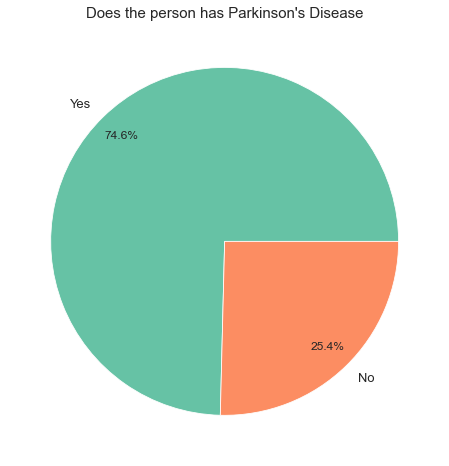

In [8]:
sizes = dict(data['class'].value_counts())

plt.figure(figsize=(12, 8))
plt.title("Does the person has Parkinson's Disease")
plt.pie(sizes.values(), labels=['Yes', 'No'], autopct="%.1f%%", pctdistance=0.85, colors=PALETTE)

plt.show()

Target feature is unbalanced, like in most medical data, but this time we have 0 class underrepresented (no Parkinsons's Disease)

I guess gender is important feature, because vocal features of male and female may vary a lot.  
So let's look on gender proportions in each class

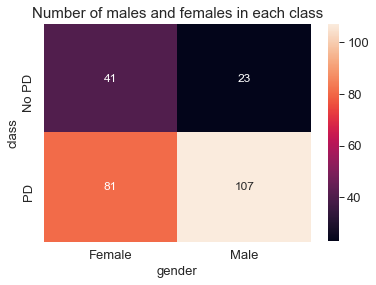

In [9]:
sns.heatmap(pd.crosstab(data['class'], data['gender']).divide(3).astype('int64'), 
            yticklabels=['No PD', 'PD'],
            xticklabels=['Female', 'Male'],
            annot=True,
            fmt='d')
plt.title('Number of males and females in each class')
plt.show()

We have:
- 41 Females and 23 Males without PD
- 81 Females and 107 Males with PD

Males are underrepresented in No PD group

Females are underrepresented in PD group

__Spplitting the data__

In [10]:
X = data.drop(columns='class')
y = data['class']

Correlations in the dataset:

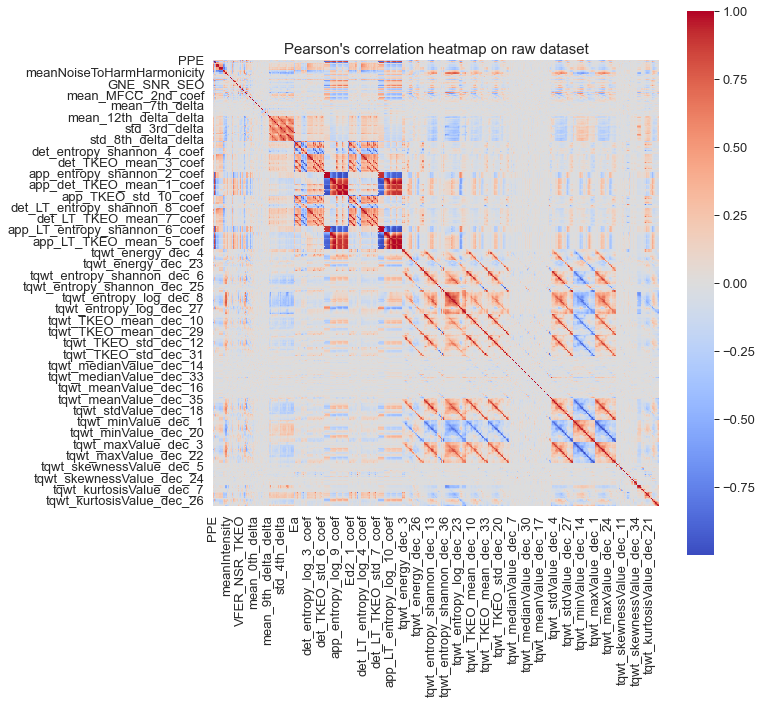

In [11]:
corr_matr = X.drop(columns=['id', 'gender']).corr(method='pearson')
plt.figure(figsize=(10,10))
sns.heatmap(corr_matr, cmap='coolwarm', square=True)
plt.title("Pearson's correlation heatmap on raw dataset")
plt.show()

We know that there are correlated features in this dataset, so non-robust to multicollinearity models might suffer

# Feature scaling

If we look on feature distributions, we will see somewhere near to normal skewed distributions and hardly skewed distributions

These are the first 20 features, but i checked features in each attribute type (see attribute descriptin) and the distributions are pretty similar

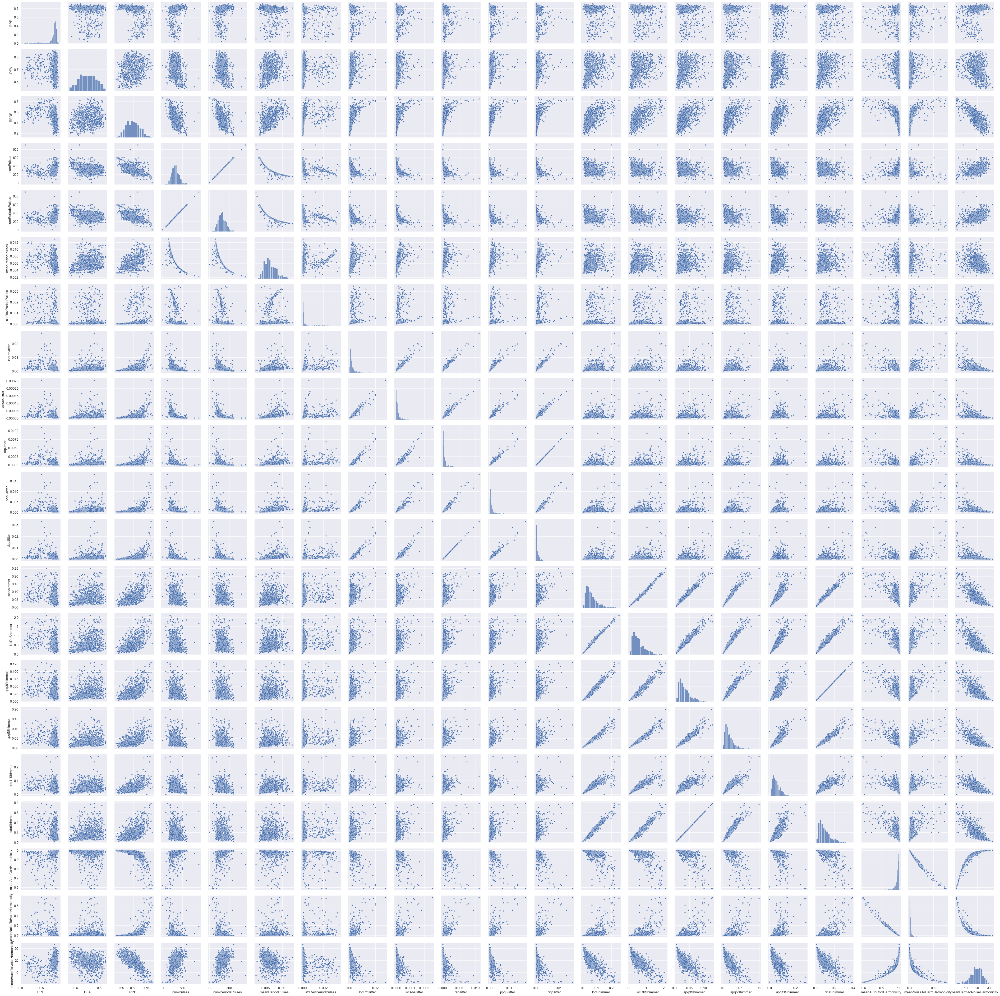

In [12]:
g = sns.pairplot(data=X.iloc[:, 2:23], 
                 kind='scatter')

plt.tight_layout()

I will use QuantileTransformer for feature scaling. This method transforms the features to follow a uniform or a normal distribution. This transformation tends to spread out the most frequent values. It also reduces the impact of outliers

First two features are `id` and `gender`, we don't need to tranform them

In [13]:
scaler = gen_features(
    columns = [[c] for c in X.iloc[:, 2:].columns.values],
    classes=[{'class': QuantileTransformer, 'output_distribution': 'normal'}]
)

In [14]:
scaling_mapper = DataFrameMapper(scaler, default=None, df_out=True)
X_scaled = scaling_mapper.fit_transform(X)

Pairplot of features after scaling:

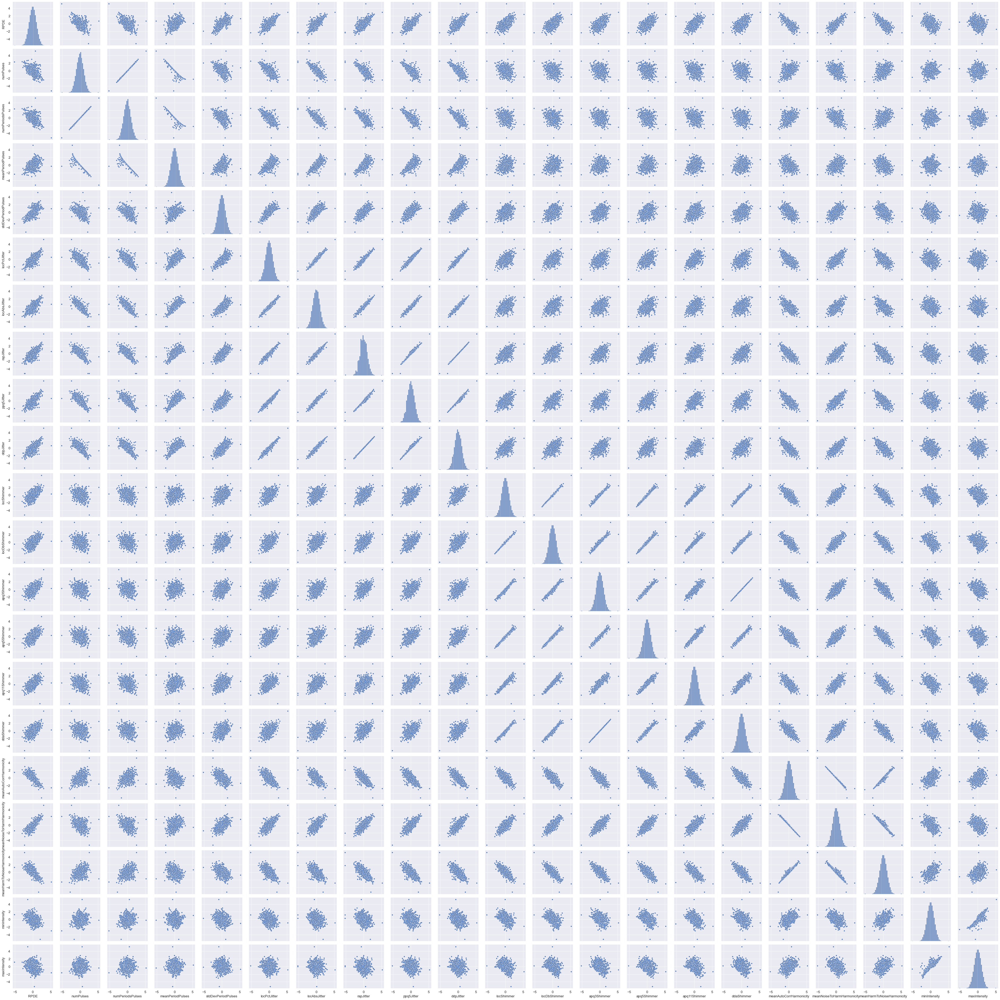

In [15]:
g = sns.pairplot(data=X_scaled.iloc[:, 2:23], 
                 kind='scatter')

plt.tight_layout()

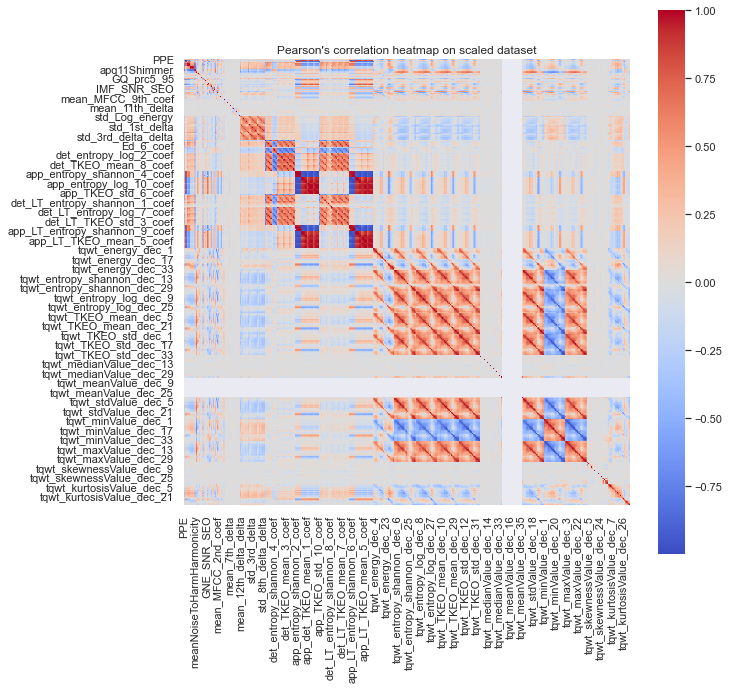

In [130]:
corr_matr = X_scaled.drop(columns=['id', 'gender']).corr(method='pearson')
plt.figure(figsize=(10,10))
sns.heatmap(corr_matr, cmap='coolwarm', square=True)
plt.title("Pearson's correlation heatmap on scaled dataset")
plt.show()

And the correlations after scaling have become bigger (colors are more saturated)

# Cross-validation scheme

Cross-validation in our data set requires stratifying by `class` and also grouping by `id` 

In [68]:
def cross_validate(estimator, 
                   X: pd.DataFrame, 
                   y: pd.Series, 
                   print_fold_scores=False, 
                   plot_cm=False, 
                   upsampling=False, 
                   resampling=False, 
                   pca=False) -> pd.DataFrame:
    """Calculates estimators's cross-validation scores on (X, y) dataset 
    
    Parameters
    ----------
    estimator : estimator to evaluate
    X : Data set to cross-validate on
    y : Data set target labels
    print_fold_scores : Set to True to print scores for each fold in cv
    plot_cm : Set to True to plot cofusion matrix
    upsampling : Set to True to upsample train data in each fold
    resampling : Set to True to resample train data in each fold
    pca : Used as n_components parameter in PCA. If False - pca is not used 
    
    Returns
    -------
    mean_cv_scores_df : DataFrame with mean cross validation scores for estimator
    """
    # defining scores to evaluate
    cv_scores = {'Accuracy': [],
                 'Recall': [],
                 'Precision': [],
                 'F1 Weighted': []}
    
    estimator_name = type(estimator).__name__
    
    # Stratify by target and group by id in order to prevent getting records 
    # of one person in train and test set
    fold = StratifiedGroupKFold(5, shuffle=True, random_state=RANDOM_STATE)
    
    for train_index, test_index in fold.split(X, y, groups=X['id']):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        
        # transformations before training
        if resampling:
            X_train, y_train = resample_gender(X_train, y_train)
        if upsampling:
            X_train, y_train = upsample(X_train, y_train)
        if pca:
            X_train, X_test = perform_pca(X_train, X_test, explained_variance=pca)

        X_train, X_test = X_train.drop(columns='id'), X_test.drop(columns='id')
        estimator.fit(X_train, y_train)

        predictions = estimator.predict(X_test)
        probabilities = estimator.predict_proba(X_test)
        
        cv_scores['Accuracy'].append(accuracy_score(y_test, predictions))
        cv_scores['Recall'].append(recall_score(y_test, predictions, pos_label=1))
        cv_scores['Precision'].append(precision_score(y_test, predictions, pos_label=1))
        cv_scores['F1 Weighted'].append(f1_score(y_test, predictions, average='weighted'))
    
    # prints scores for each fold if True
    if print_fold_scores:
        for item in cv_scores.items():
            print(item)
    
    mean_cv_scores = {k: np.mean(v) for k, v in cv_scores.items()}
    mean_cv_scores_df = pd.DataFrame.from_dict(data={estimator_name: mean_cv_scores.values()}, 
                                               orient='index', 
                                               columns=mean_cv_scores.keys())
    
    if plot_cm:
        plot_confusion_matrix(y_test, predictions, estimator_name)
        
    return mean_cv_scores_df

def plot_confusion_matrix(y_true: pd.Series, 
                          y_pred: pd.Series, 
                          estimator_name: str):
    """Plots confusion matrix for the last fold
    
    Parameters
    ----------
    y_true : True class labels
    y_pred : Predicted class labels
    """
    conf = confusion_matrix(y_true, y_pred)
    sns.heatmap(conf,         
                yticklabels=['No PD', 'PD'],
                xticklabels=['No PD', 'PD'],
                annot=True,
                fmt='d')
    plt.title(f'{estimator_name} confusion matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()
    
def upsample(X: pd.DataFrame, y: pd.Series) -> Tuple[pd.DataFrame, pd.Series]:
    """Upsamples dataset with SOMTENC 
    
    Parameters
    ----------
    X : Data set to uspsample
    y : Data set class labels
    
    Returns
    -------
    X_upsampled : upsampled dataset
    y_upsampled : upsampled dataset class labels
    """
    smotenc = SMOTENC(categorical_features=[X.columns.get_loc("gender")], 
                    random_state=RANDOM_STATE, 
                    sampling_strategy=1)
    
    X_upsampled, y_upsampled = smotenc.fit_resample(X, y)
    
    return X_upsampled, y_upsampled
    
def resample_gender(X: pd.DataFrame, y: pd.Series) -> Tuple[pd.DataFrame, pd.Series]:
    """Resamples gender proportions in each class
    
    Parameters
    ----------
    X : Data set to resample
    y : Data set class labels
    
    Returns
    -------
    X_resampled : resampled dataset
    y_resampled : resampled dataset class labels
    """
    
    X_full = X.copy()
    X_full['class_'] = y

    # resampling gender proportions in 1 class
    df_majority_1 = X_full.query('class_ == 1 and gender == 1')
    df_minority_1 = X_full.query('class_ == 1 and gender == 0')

    df_minority_resampled_1 = resample(df_minority_1, 
                                       replace=True,
                                       n_samples=len(df_majority_1),
                                       random_state=RANDOM_STATE)

    df_resampled_1 = pd.concat([df_majority_1, df_minority_resampled_1])

    # resampling gender proportions in 0 class
    df_majority_0 = X_full.query('class_ == 0 and gender == 0')
    df_minority_0 = X_full.query('class_ == 0 and gender == 1')

    df_minority_resampled_0 = resample(df_minority_0, 
                                       replace=True,
                                       n_samples=len(df_majority_0),
                                       random_state=RANDOM_STATE)

    df_resampled_0 = pd.concat([df_majority_0, df_minority_resampled_0])

    # Combining two resampled subsets
    df_resampled = pd.concat([df_resampled_1, df_resampled_0], ignore_index=True)

    X_resampled = df_resampled.drop(columns='class_')
    y_resampled = df_resampled['class_']
    
    return X_resampled, y_resampled

def perform_pca(X_train, X_test, explained_variance) -> Tuple[pd.DataFrame, pd.DataFrame]:
    """Performs PCA on 
    
    Parameters
    ----------
    X_train : Train data set to fit PCA
    X_test : Test data set to tranform with PCA  
    
    Returns
    -------
    X_train_pca : PCA-transformed train data set 
    y_test_pca : PCA-transformed test data set
    """
    pca = PCA(n_components=explained_variance).fit(X_train.drop(columns=['id', 'gender']))
    pca_train_data = pca.transform(X_train.drop(columns=['id', 'gender']))
    pca_test_data = pca.transform(X_test.drop(columns=['id', 'gender']))
    
    X_train_pca = pd.DataFrame.from_records(data=pca_train_data)
    
    #reset index to map id and gender to pca data
    X_train.reset_index(inplace=True)
    
    X_train_pca['id'] = X_train['id']
    X_train_pca['gender'] = X_train['gender']
    
    X_test_pca = pd.DataFrame.from_records(data=pca_test_data)
    
    #reset index to map id and gender to pca data
    X_test.reset_index(inplace=True)
    
    X_test_pca['id'] = X_test['id']
    X_test_pca['gender'] = X_test['gender']
    
    return X_train_pca, X_test_pca

def display_side_by_side(dfs: list, titles: list):
    """Displays dataframes side by side
    
    Parameters
    ----------
    dfs : list of pandas.DataFrame
    titles : list of dataframe titles
    """
    output = ""
    combined = dict(zip(titles, dfs))
    for title, df in combined.items():
        output += df.style.set_table_attributes("style='display:inline'").set_caption(title)._repr_html_()
        output += "\xa0\xa0\xa0"
    display(HTML(output))

Now let's check the scores for diferent models out-of-box

## KNN

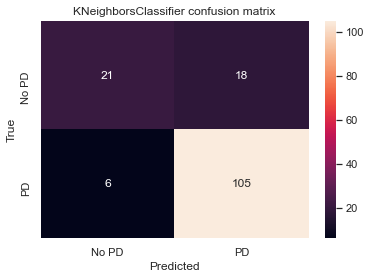

In [69]:
models_results = cross_validate(KNeighborsClassifier(), X_scaled, y, plot_cm=True)

In [70]:
models_results

,Accuracy,Recall,Precision,F1 Weighted
KNeighborsClassifier,0.811085,0.944745,0.826269,0.791625


## LogReg

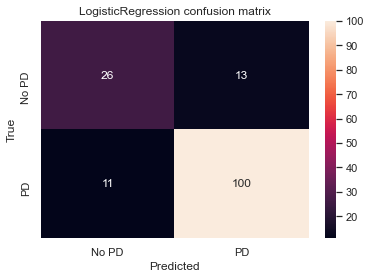

In [71]:
lg_cv = cross_validate(LogisticRegression(random_state=RANDOM_STATE), X_scaled, y, plot_cm=True)

In [72]:
lg_cv

,Accuracy,Recall,Precision,F1 Weighted
LogisticRegression,0.808418,0.890676,0.858686,0.804517


In [73]:
models_results = models_results.append(lg_cv)

## DT

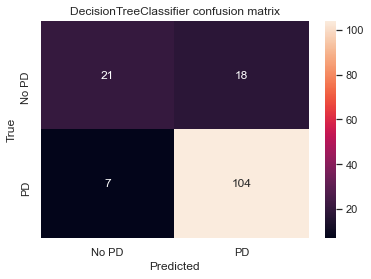

In [74]:
dt_cv = cross_validate(DecisionTreeClassifier(random_state=RANDOM_STATE, max_depth=6), X, y, plot_cm=True)

In [75]:
dt_cv

,Accuracy,Recall,Precision,F1 Weighted
DecisionTreeClassifier,0.75702,0.883705,0.807822,0.740088


In [76]:
models_results = models_results.append(dt_cv)

## RF

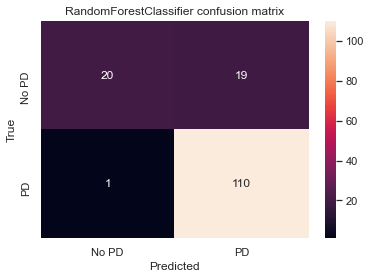

In [77]:
rf_cv = cross_validate(RandomForestClassifier(random_state=RANDOM_STATE, max_depth=7), X, y, plot_cm=True)

In [78]:
rf_cv

,Accuracy,Recall,Precision,F1 Weighted
RandomForestClassifier,0.823085,0.963017,0.828253,0.800423


In [79]:
models_results = models_results.append(rf_cv)

## CatBoost

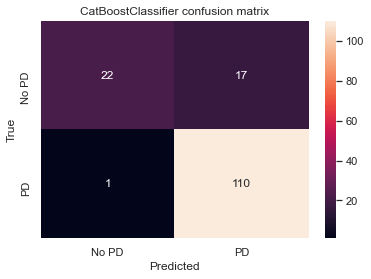

In [80]:
catboost_cv = cross_validate(CatBoostClassifier(cat_features=['gender'], verbose=False, random_seed=RANDOM_STATE), X, y, plot_cm=True)

In [81]:
catboost_cv

,Accuracy,Recall,Precision,F1 Weighted
CatBoostClassifier,0.841569,0.972089,0.840886,0.822815


In [82]:
models_results = models_results.append(catboost_cv)

## LightGBM

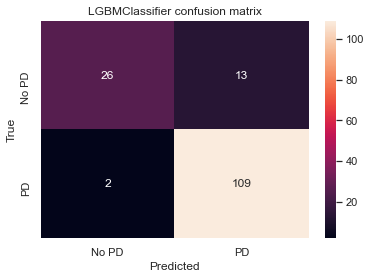

In [83]:
lgbm_cv = cross_validate(LGBMClassifier(random_state=RANDOM_STATE), X, y, plot_cm=True)

In [84]:
lgbm_cv

,Accuracy,Recall,Precision,F1 Weighted
LGBMClassifier,0.848209,0.961296,0.854121,0.834606


In [85]:
models_results = models_results.append(lgbm_cv)

## XGBoost

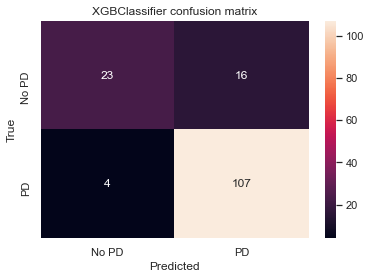

In [86]:
xgb_cv = cross_validate(XGBClassifier(random_state=RANDOM_STATE, verbosity=0), X, y, plot_cm=True)

In [87]:
xgb_cv

,Accuracy,Recall,Precision,F1 Weighted
XGBClassifier,0.820418,0.945599,0.836007,0.803911


In [88]:
models_results = models_results.append(xgb_cv)

__Models comparison:__

In [89]:
models_results

,Accuracy,Recall,Precision,F1 Weighted
KNeighborsClassifier,0.811085,0.944745,0.826269,0.791625
LogisticRegression,0.808418,0.890676,0.858686,0.804517
DecisionTreeClassifier,0.757020,0.883705,0.807822,0.740088
RandomForestClassifier,0.823085,0.963017,0.828253,0.800423
CatBoostClassifier,0.841569,0.972089,0.840886,0.822815
LGBMClassifier,0.848209,0.961296,0.854121,0.834606
XGBClassifier,0.820418,0.945599,0.836007,0.803911


LGBMClassifier gives the best Recall - Precision ratio and the best accuracy

# Upsampling with SMOTE

Now let's try to cross validate with SMOTE upsampling

In [90]:
setting = {
    'upsampling': True
}

models = [
    dict({'estimator': KNeighborsClassifier(),
          'X': X_scaled,
          'y': y}, 
         **setting),
    dict({'estimator': LogisticRegression(random_state=RANDOM_STATE),
          'X': X_scaled,
          'y': y}, 
         **setting),
    dict({'estimator': DecisionTreeClassifier(max_depth=6, random_state=RANDOM_STATE),
          'X': X,
          'y': y}, 
         **setting),
    dict({'estimator': RandomForestClassifier(max_depth=7, random_state=RANDOM_STATE),
          'X': X,
          'y': y}, 
         **setting),
    dict({'estimator': CatBoostClassifier(cat_features=['gender'], verbose=False, random_seed=RANDOM_STATE),
          'X': X,
          'y': y}, 
         **setting),
    dict({'estimator': LGBMClassifier(random_state=RANDOM_STATE),
          'X': X,
          'y': y}, 
         **setting),
    dict({'estimator': XGBClassifier(verbosity=0, random_state=RANDOM_STATE),
          'X': X,
          'y': y}, 
         **setting)
]

In [91]:
models_results_upsampling = pd.DataFrame()
for model in models:
    models_results_upsampling = models_results_upsampling.append(cross_validate(**model))

In [92]:
display_side_by_side([models_results, models_results_upsampling], 
                     titles=['original data cv scores', 'upsampled data cv scores'])

,Accuracy,Recall,Precision,F1 Weighted
KNeighborsClassifier,0.811085,0.944745,0.826269,0.791625
LogisticRegression,0.808418,0.890676,0.858686,0.804517
DecisionTreeClassifier,0.757020,0.883705,0.807822,0.740088
RandomForestClassifier,0.823085,0.963017,0.828253,0.800423
CatBoostClassifier,0.841569,0.972089,0.840886,0.822815
LGBMClassifier,0.848209,0.961296,0.854121,0.834606
XGBClassifier,0.820418,0.945599,0.836007,0.803911
,Accuracy,Recall,Precision,F1 Weighted
KNeighborsClassifier,0.636837,0.571013,0.901963,0.658256
LogisticRegression,0.805778,0.877060,0.866023,0.804765


As expected, recall decreased, precision increased, that is not really what we want

# Resampling 

This is how resampling method works:

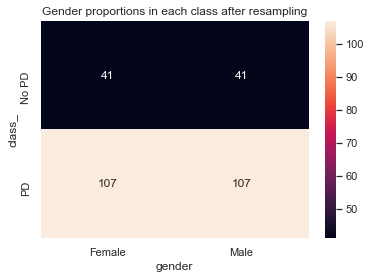

In [93]:
X_resampled, y_resampled = resample_gender(X_scaled, y)

sns.heatmap(pd.crosstab(y_resampled, X_resampled['gender']).divide(3).astype('int64'), 
            yticklabels=['No PD', 'PD'],
            xticklabels=['Female', 'Male'],
            annot=True,
            fmt='d')

plt.title('Gender proportions in each class after resampling')
plt.show()

Now let's cross validae on resampled data, so gender proportion in each class are equal

In [94]:
setting = {
    'resampling': True
}

models = [
    dict({'estimator': KNeighborsClassifier(),
          'X': X_scaled,
          'y': y}, 
         **setting),
    dict({'estimator': LogisticRegression(random_state=RANDOM_STATE),
          'X': X_scaled,
          'y': y}, 
         **setting),
    dict({'estimator': DecisionTreeClassifier(max_depth=6, random_state=RANDOM_STATE),
          'X': X,
          'y': y}, 
         **setting),
    dict({'estimator': RandomForestClassifier(max_depth=7, random_state=RANDOM_STATE),
          'X': X,
          'y': y}, 
         **setting),
    dict({'estimator': CatBoostClassifier(cat_features=['gender'], verbose=False, random_seed=RANDOM_STATE),
          'X': X,
          'y': y}, 
         **setting),
    dict({'estimator': LGBMClassifier(random_state=RANDOM_STATE),
          'X': X,
          'y': y}, 
         **setting),
    dict({'estimator': XGBClassifier(verbosity=0, random_state=RANDOM_STATE),
          'X': X,
          'y': y}, 
         **setting)
]

In [95]:
models_results_resampling = pd.DataFrame()
for model in models:
    models_results_resampling = models_results_resampling.append(cross_validate(**model))

In [96]:
display_side_by_side([models_results, models_results_resampling], 
                     titles=['original data cv scores', 'resampled data cv scores'])

,Accuracy,Recall,Precision,F1 Weighted
KNeighborsClassifier,0.811085,0.944745,0.826269,0.791625
LogisticRegression,0.808418,0.890676,0.858686,0.804517
DecisionTreeClassifier,0.757020,0.883705,0.807822,0.740088
RandomForestClassifier,0.823085,0.963017,0.828253,0.800423
CatBoostClassifier,0.841569,0.972089,0.840886,0.822815
LGBMClassifier,0.848209,0.961296,0.854121,0.834606
XGBClassifier,0.820418,0.945599,0.836007,0.803911
,Accuracy,Recall,Precision,F1 Weighted
KNeighborsClassifier,0.791085,0.914556,0.823563,0.776463
LogisticRegression,0.804654,0.869467,0.868380,0.805225


Seems like the scores are a little lower than on raw data.

__CV scores on original data, upsampled data and resampled data compared:__

In [97]:
display_side_by_side([models_results, models_results_upsampling, models_results_resampling], 
                     titles=['original data cv scores', 'upsampled data cv scores', 'resampled data cv scores'])

,Accuracy,Recall,Precision,F1 Weighted
KNeighborsClassifier,0.811085,0.944745,0.826269,0.791625
LogisticRegression,0.808418,0.890676,0.858686,0.804517
DecisionTreeClassifier,0.757020,0.883705,0.807822,0.740088
RandomForestClassifier,0.823085,0.963017,0.828253,0.800423
CatBoostClassifier,0.841569,0.972089,0.840886,0.822815
LGBMClassifier,0.848209,0.961296,0.854121,0.834606
XGBClassifier,0.820418,0.945599,0.836007,0.803911
,Accuracy,Recall,Precision,F1 Weighted
KNeighborsClassifier,0.636837,0.571013,0.901963,0.658256
LogisticRegression,0.805778,0.877060,0.866023,0.804765


# Dimensionality Reduction

## PCA

Let's look how the data is distributed in 3 dimensions (using PCA)

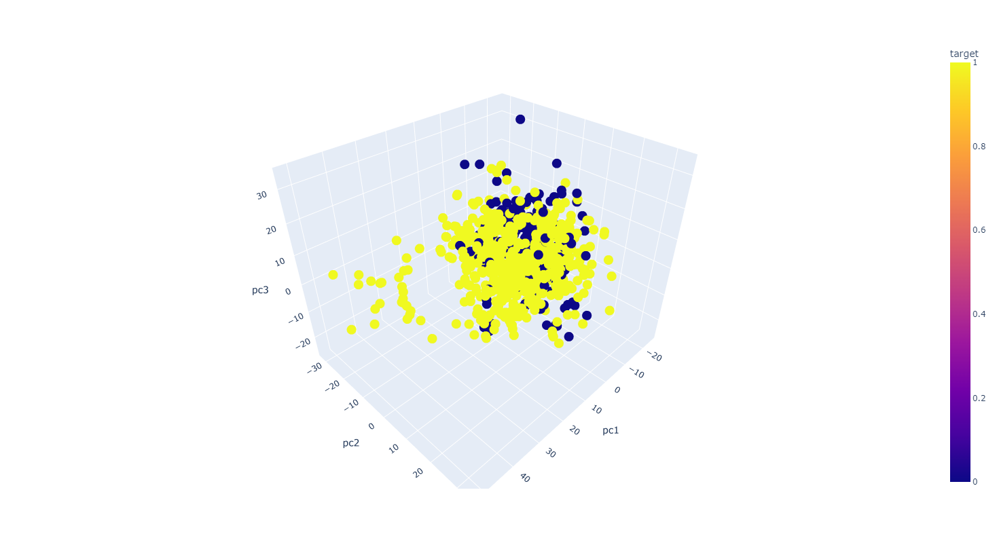

In [50]:
pca_data = PCA(n_components=3).fit_transform(X_scaled.drop(columns='id'))
plot_df = pd.DataFrame.from_records(data=pca_data,columns=['pc1','pc2', 'pc3'])
plot_df['target'] = y
fig = px.scatter_3d(plot_df, x='pc1', y='pc2', z='pc3', color='target', width=800, height=800)
fig.show()


As we see, the data is not very separable even on 3 dimensions.

Let's find the optimal number of components

In [131]:
EXPLAINED_VARIANCE = 0.99

pca = PCA(n_components=EXPLAINED_VARIANCE).fit(X_scaled.drop(columns=['id', 'gender']))

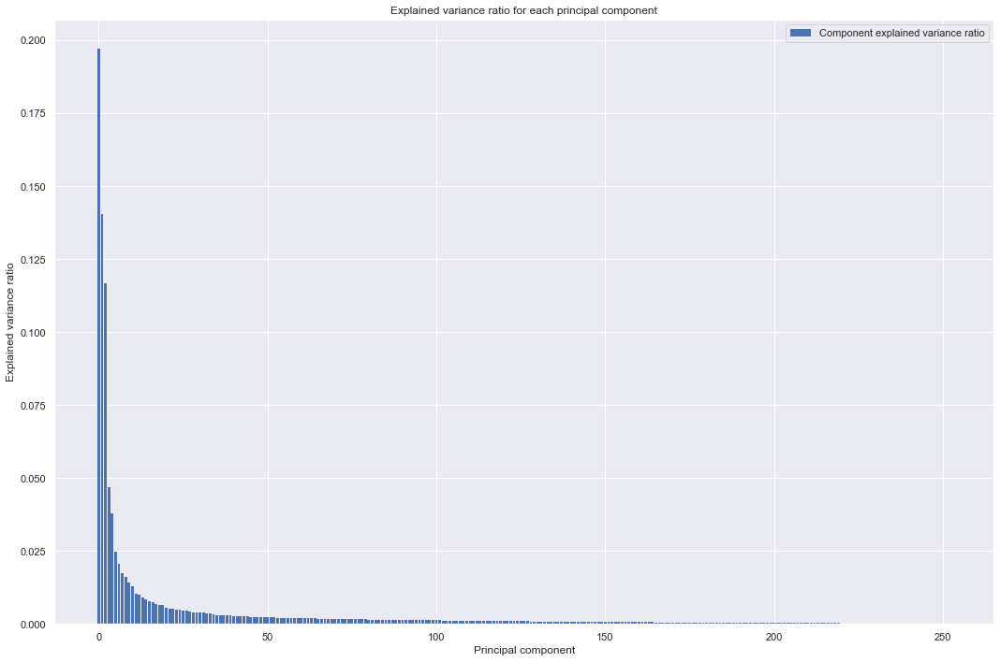

In [132]:
plt.figure(figsize=(15, 10))

plt.bar(range(len(pca.explained_variance_)), pca.explained_variance_ratio_, align='center',
        label='Component explained variance ratio', edgecolor = "none")
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component')
plt.title('Explained variance ratio for each principal component')
plt.legend()
plt.tight_layout()


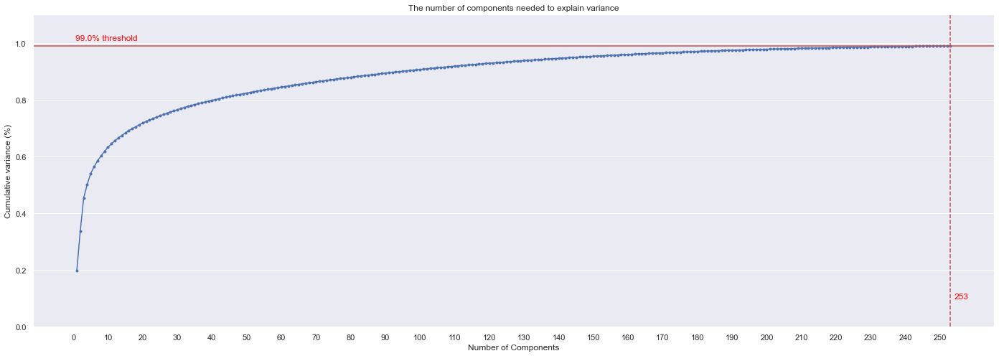

In [133]:
n_components = len(pca.explained_variance_ratio_)

fig, ax = plt.subplots(figsize=(24, 8))
x_ticks = np.arange(1, n_components + 1, step=1)
y_values = np.cumsum(pca.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(x_ticks, y_values, marker='.', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, n_components + 1, step=10))
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=EXPLAINED_VARIANCE, color='r', linestyle='-')

plt.axvline(x=n_components, color='r', linestyle='--')

plt.text(0.5, 1.01, f'{EXPLAINED_VARIANCE*100}% threshold', color = 'red')
plt.text(n_components + 1, 0.1, f'{n_components}', color = 'red')

ax.grid(axis='x')
plt.xticks(rotation=0)
plt.show()

I would choose 150 number of components, that's  5 times less features, but they still explain most of the variance (around 95%)

In [134]:
pca.explained_variance_ratio_[:150].sum()

0.9533136250974715

That's how `perform_pca` method works on our data (just an example to validate):

In [135]:
train_pca, test_pca = perform_pca(X_scaled[:600], X_scaled[600:], 150)

In [136]:
train_pca

,0,1,2,3,4,5,6,7,8,9,...,142,143,144,145,146,147,148,149,id,gender
0,13.609080,0.326266,-14.462958,5.078912,-3.832594,-0.712587,0.270110,4.283841,-2.277964,-0.613263,...,-0.204603,0.021878,0.314220,-0.640144,0.128641,0.868132,0.785653,0.049861,0,1
1,11.276008,2.841260,-13.902793,3.342600,-0.693164,-2.364227,0.707274,7.368882,-3.453159,-1.850423,...,0.413321,-0.728607,0.174916,0.905476,-0.466927,0.038537,1.291694,-0.281092,0,1
2,18.776915,-1.908472,-20.287853,-0.054871,1.738681,-0.272191,1.624944,9.537498,0.453420,-0.288417,...,-0.010293,0.317714,0.744461,0.853664,0.999261,0.824598,0.083113,0.362053,0,1
3,0.817423,23.238483,11.830815,3.360724,-7.547983,1.556861,-3.638011,1.051139,1.696525,-7.686305,...,-1.063778,0.980587,-0.470830,-1.025919,-0.159439,-0.107264,-0.905128,0.118457,1,0
4,0.200733,18.189922,14.026642,1.596643,-10.301452,2.952257,-3.877815,-0.902817,0.240172,-4.408860,...,0.783578,0.975649,-0.427022,0.904874,-0.107845,-0.385236,-0.067177,-0.855177,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,-0.171786,25.005002,11.415603,-1.930345,6.230956,11.732353,-3.236190,-2.684915,1.379201,13.389252,...,-0.490037,-0.020002,-0.134656,-1.121876,0.481299,-0.848565,1.877484,-0.928815,198,1
596,-0.807004,19.449079,12.503684,-9.526401,4.338582,12.999730,0.767129,-1.850044,1.411803,10.051904,...,1.401389,-0.699935,-1.021312,-0.545748,-1.044482,-1.262368,0.599942,0.934303,198,1
597,-3.081776,6.970520,-6.213406,2.304810,8.295709,2.327517,8.299277,-2.516183,0.825466,0.325311,...,-0.076769,0.124712,1.034366,-1.439486,0.587625,0.500138,-0.107605,0.348741,199,1
598,-0.137360,9.515391,-1.816898,1.654943,7.276385,-1.788391,4.738707,-2.548593,-1.648439,2.138618,...,0.873129,0.902827,-0.700269,0.573242,0.545813,0.830115,-0.674118,-0.363116,199,1


Let's check how PCA affects our models. This time, even trees models are trained on scaled data, because we must scale the data before PCA

In [57]:
setting = {
    'pca': 150,
}

models = [
    dict({'estimator': KNeighborsClassifier(),
          'X': X_scaled,
          'y': y}, 
         **setting),
    dict({'estimator': LogisticRegression(random_state=RANDOM_STATE),
          'X': X_scaled,
          'y': y}, 
         **setting),
    dict({'estimator': DecisionTreeClassifier(max_depth=6, random_state=RANDOM_STATE),
          'X': X_scaled,
          'y': y}, 
         **setting),
    dict({'estimator': RandomForestClassifier(max_depth=7, random_state=RANDOM_STATE),
          'X': X_scaled,
          'y': y}, 
         **setting),
    dict({'estimator': CatBoostClassifier(verbose=False, random_seed=RANDOM_STATE),
          'X': X_scaled,
          'y': y}, 
         **setting),
    dict({'estimator': LGBMClassifier(random_state=RANDOM_STATE),
          'X': X_scaled,
          'y': y}, 
         **setting),
    dict({'estimator': XGBClassifier(verbosity=0, random_state=RANDOM_STATE),
          'X': X_scaled,
          'y': y}, 
         **setting)
]

In [58]:
models_results_pca = pd.DataFrame()
for model in models:
    models_results_pca = models_results_pca.append(cross_validate(**model))

In [59]:
models_results_pca

,Accuracy,Recall,Precision,ROC-AUC
KNeighborsClassifier,0.809752,0.944745,0.825117,0.767605
LogisticRegression,0.787320,0.866991,0.852598,0.811031
DecisionTreeClassifier,0.747817,0.875534,0.802767,0.606623
RandomForestClassifier,0.759373,0.998198,0.756871,0.786444
CatBoostClassifier,0.813856,0.972949,0.813697,0.820953
LGBMClassifier,0.816575,0.960980,0.822623,0.813655
XGBClassifier,0.823216,0.958882,0.830020,0.809987


So the results are not good, PCA negatively affects models scores. Some models are definetly overfitted (RFC, CatBoost)

As the result model I would choose LGBMClassifier with resampling.
- LGBMClassifier provides us with the best recall/precision tradeoff
- The intuition about resampling gender proportions in each class: training on resampled data will be more robust to test sets, that not look like train set (in terms of class/gender proportions). And i assume that the model will be used equally on males and females

# Model tuning

As long as I use grouping, resampling and stratifying, I have to write my own wrapper transformer with `fit_resample` method

In [103]:
class CustomResamplingTransformer():
    
    def fit_resample(self, X, y):
        X_copy = X.copy()
        
        # can't drop id column, because input shape must match output shape
        X_copy['id'] = -1
        
        return resample_gender(X_copy, y)

In [104]:
pipeline = Pipeline([
    ('resample', CustomResamplingTransformer()),
    ('estimator', LGBMClassifier(random_state=RANDOM_STATE))
])

I will use F1 Weighted score in GridSearch, because it takes into account both Recall and Precision (for both classes).  
I do not use first class Recall for tuning, because the model will just classify almost all objects as 1 and that is a bad model

In [105]:
params = {
    'estimator__num_leaves':[10, 20, 30, 40, 60, 80, 100],
    'estimator__n_estimators': [200, 250, 300, 350],
    'estimator__max_depth':[-1, 4, 6, 8, 10, 15]}

In [106]:
gs = GridSearchCV(pipeline,
                  param_grid=params,
                  cv=StratifiedGroupKFold(5, shuffle=True, random_state=RANDOM_STATE).split(X, y, groups=X['id']),
                  scoring='f1_weighted')

In [107]:
gs.fit(X, y)

GridSearchCV(cv=<generator object _BaseKFold.split at 0x00000238351063C0>,
             estimator=Pipeline(steps=[('resample',
                                        <__main__.CustomResamplingTransformer object at 0x000002383485A370>),
                                       ('estimator',
                                        LGBMClassifier(random_state=42))]),
             param_grid={'estimator__max_depth': [-1, 4, 6, 8, 10, 15],
                         'estimator__n_estimators': [200, 250, 300, 350],
                         'estimator__num_leaves': [10, 20, 30, 40, 60, 80,
                                                   100]},
             scoring='f1_weighted')

In [109]:
gs.best_params_

{'estimator__max_depth': 4,
 'estimator__n_estimators': 350,
 'estimator__num_leaves': 20}

In [110]:
gs.best_score_

0.8483189912998059

('Accuracy', [0.8300653594771242, 0.8933333333333333, 0.8169934640522876, 0.8466666666666667, 0.9])
('Recall', [0.9298245614035088, 0.967479674796748, 0.9369369369369369, 0.9619047619047619, 0.9819819819819819])
('Precision', [0.8548387096774194, 0.9083969465648855, 0.832, 0.8416666666666667, 0.8934426229508197])
('F1 Weighted', [0.8211402207942001, 0.8857377610407394, 0.8041209704220671, 0.8364444444444444, 0.8941515597975785])


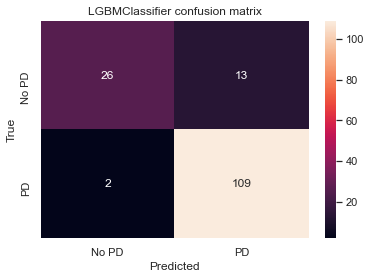

,Accuracy,Recall,Precision,F1 Weighted
LGBMClassifier,0.857412,0.955626,0.866069,0.848319


In [123]:
cross_validate(LGBMClassifier(random_state=RANDOM_STATE, max_depth=4, n_estimators=350, num_leaves=20), X, y, resampling=True, print_fold_scores=True, plot_cm=True)

Both precision and recall has increased

We can also see that, for example, first and the last fold scores differs a lot. And that is happend because of small dataset, i guess 

The second lap of GridSearch (now we specify parameters in smaller limits):

In [124]:
params_specific = {
    'estimator__num_leaves':[16, 18, 20, 22, 24],
    'estimator__n_estimators': [330, 340, 350, 360, 370],
    'estimator__max_depth':[3, 4, 5]}

In [125]:
gs_specific = GridSearchCV(pipeline,
                           param_grid=params_specific,
                           cv=StratifiedGroupKFold(5, shuffle=True, random_state=RANDOM_STATE).split(X, y, groups=X['id']),
                           scoring='f1_weighted')

In [126]:
gs_specific.fit(X, y)

GridSearchCV(cv=<generator object _BaseKFold.split at 0x00000238385F1AC0>,
             estimator=Pipeline(steps=[('resample',
                                        <__main__.CustomResamplingTransformer object at 0x000002383485A370>),
                                       ('estimator',
                                        LGBMClassifier(random_state=42))]),
             param_grid={'estimator__max_depth': [3, 4, 5],
                         'estimator__n_estimators': [330, 340, 350, 360, 370],
                         'estimator__num_leaves': [16, 18, 20, 22, 24]},
             scoring='f1_weighted')

In [127]:
gs_specific.best_score_

0.8496686277579479

In [128]:
gs_specific.best_params_

{'estimator__max_depth': 4,
 'estimator__n_estimators': 370,
 'estimator__num_leaves': 16}

('Accuracy', [0.8300653594771242, 0.8933333333333333, 0.8235294117647058, 0.8466666666666667, 0.9])
('Recall', [0.9298245614035088, 0.967479674796748, 0.9369369369369369, 0.9619047619047619, 0.990990990990991])
('Precision', [0.8548387096774194, 0.9083969465648855, 0.8387096774193549, 0.8416666666666667, 0.8870967741935484])
('F1 Weighted', [0.8211402207942001, 0.8857377610407394, 0.8122547550635477, 0.8364444444444444, 0.8927659574468085])


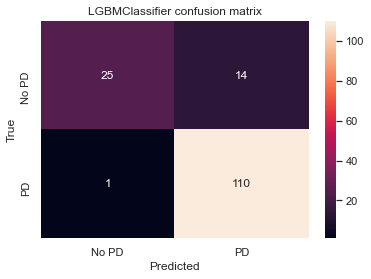

,Accuracy,Recall,Precision,F1 Weighted
LGBMClassifier,0.858719,0.957427,0.866142,0.849669


In [129]:
cross_validate(LGBMClassifier(random_state=RANDOM_STATE, max_depth=4, n_estimators=370, num_leaves=16), X, y, print_fold_scores=True, plot_cm=True, resampling=True)

And the second lap also helped a little bit.  
Pretty good scores, I think.

# Results 

What has been done in this work:
- Simple EDA (features are already extracted)
- Custom cross-validation scheme with stratifying by `class` and grouping by `id` 
- Out-of-box models comparison (LGBMClassifier is the best)
- Upsampling using SMOTENC (badly affects the scores)
- Resampling gender proportions in each class (used in the result model) 
- PCA (badly affects the scores)
- Model tuning

So we have the following model

LGBMClassifier on resampled data with the parameters:
- max_depth: 4
- n_estimators: 370
- num_leaves: 16

And the mean cv scores of this model are:
- Accuracy: 0.858719
- Recall: 0.957427
- Precision: 0.866142
- F1 Weighted: 0.849669